In [1]:
import ast
import glob
import json
import os

import albumentations
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp
import skimage
import torch
from IPython.core.interactiveshell import InteractiveShell
from tqdm import tqdm

InteractiveShell.ast_node_interactivity = "all"

In [2]:
df = pd.read_csv("/app/_data/folds.csv")
df[["day", "slice"]] = df[["day", "slice"]].astype("int")
df["npy_path"] = "/app/_data/npy/" + df["id"] + ".npy"
with open("/app/_data/labels.json", "r") as f:
    labels = json.load(f)

In [3]:
class Dataset(torch.utils.data.Dataset):
    def __init__(
        self,
        df,
        img_size,
        n_img_chanels,
        uint8,
        sequence,
        norm,
        batch_size,
        shuffle,
        seed,
        transform=None,
    ):
        self.df = df.reset_index(drop=True)
        self.img_size = img_size
        self.n_img_chanels = n_img_chanels
        self.uint8 = uint8
        self.sequence = sequence
        self.norm = norm
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.seed = seed
        self.transform = transform
        if self.shuffle:
            self.df = self.df.sample(frac=1, random_state=self.seed).reset_index(
                drop=True
            )

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, ix):
        npy_path = df.loc[ix, "3Dnpy_s1"]
        img = np.load(npy_path)
        if img.shape[:2] != self.img_size:
            img = cv2.resize(img, (self.img_size[0], self.img_size[1]))
        mask = img[:, :, 3:]
        if self.sequence:
            img = img[:, :, :3]
        else:
            img = img[:, :, :1]
            if self.n_img_chanels == 3:
                img = np.repeat(img, 3, 2)
        img = img.astype("float32")
        if self.transform is not None:
            transformed = self.transform(image=img, mask=mask)
            img = transformed["image"]
            mask = transformed["mask"]
        if self.norm:
            img -= img.min()
            img /= img.max()
        return img, mask

In [4]:
ds = Dataset(
    df=df,
    img_size=(384, 384),
    n_img_chanels=1,
    uint8=False,
    sequence=False,
    norm=True,
    batch_size=32,
    shuffle=False,
    seed=42,
    transform=None,
)

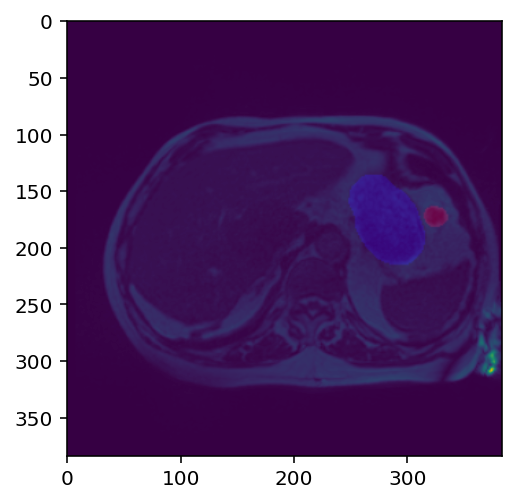

In [5]:
img, mask = ds.__getitem__(75)
plt.imshow(img)
plt.imshow(mask, alpha=0.2)
plt.show();

# albumentations

## RandomResizedCrop

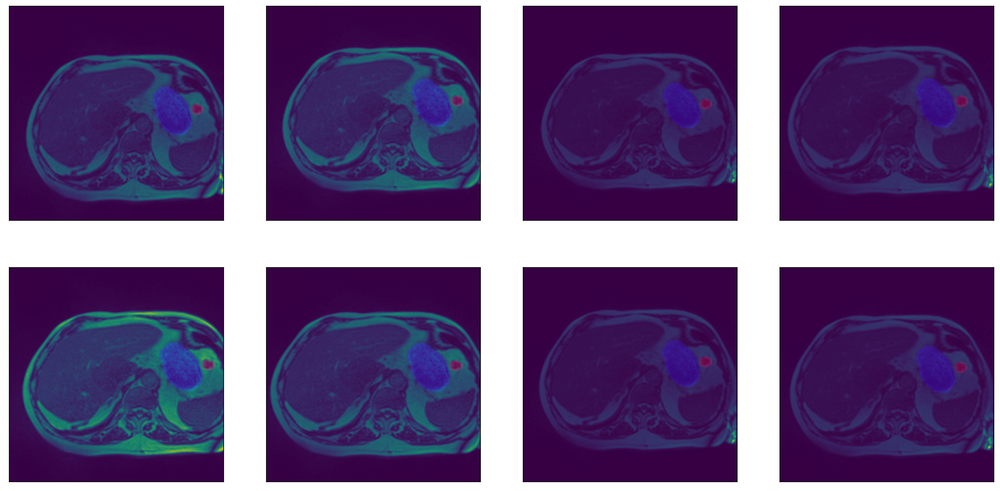

In [6]:
img_size = (384, 384)
one_transform = albumentations.augmentations.crops.transforms.RandomResizedCrop(
    height=img_size[0],
    width=img_size[1],
    scale=(0.8, 1.0),
    ratio=(0.95, 1.05),
    interpolation=cv2.INTER_LINEAR,
    p=1.0,
)
plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(image=img, mask=mask)
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## ElasticTransform

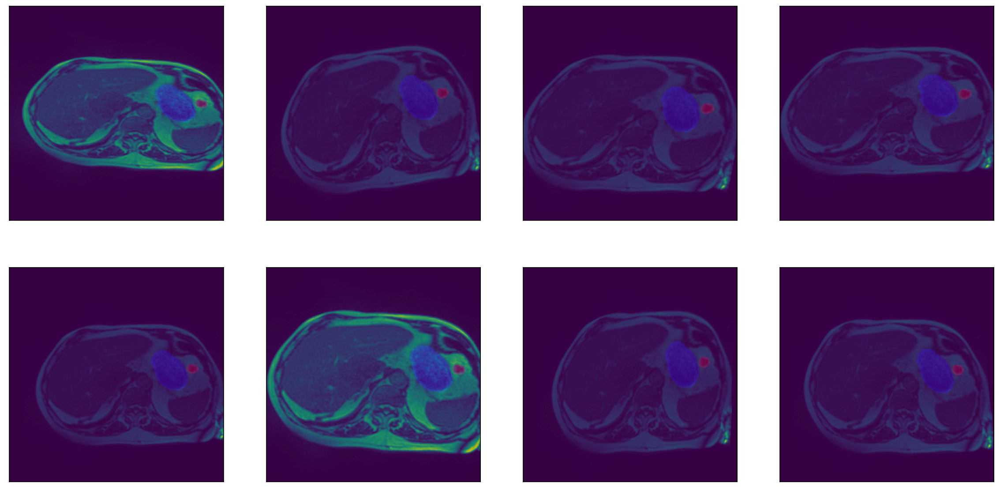

In [7]:
one_transform = albumentations.ElasticTransform(
    alpha=1,
    sigma=25,
    alpha_affine=25,
    border_mode=0,
    interpolation=cv2.INTER_LINEAR,
    value=0,
    mask_value=0,
    approximate=False,
    same_dxdy=False,
    p=1,
)
plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(image=img, mask=mask)
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## Perspective

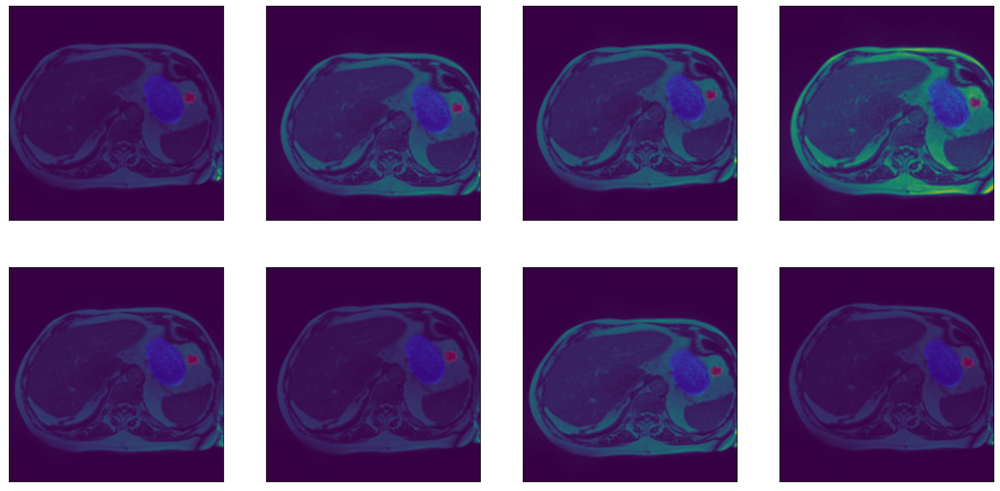

In [8]:
one_transform = albumentations.augmentations.geometric.transforms.Perspective(
    scale=(0.05, 0.05),
    keep_size=True,
    pad_mode=0,
    pad_val=0,
    mask_pad_val=0,
    fit_output=False,
    interpolation=cv2.INTER_LINEAR,
    p=1,
)
plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(image=img, mask=mask)
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## GridDistortion

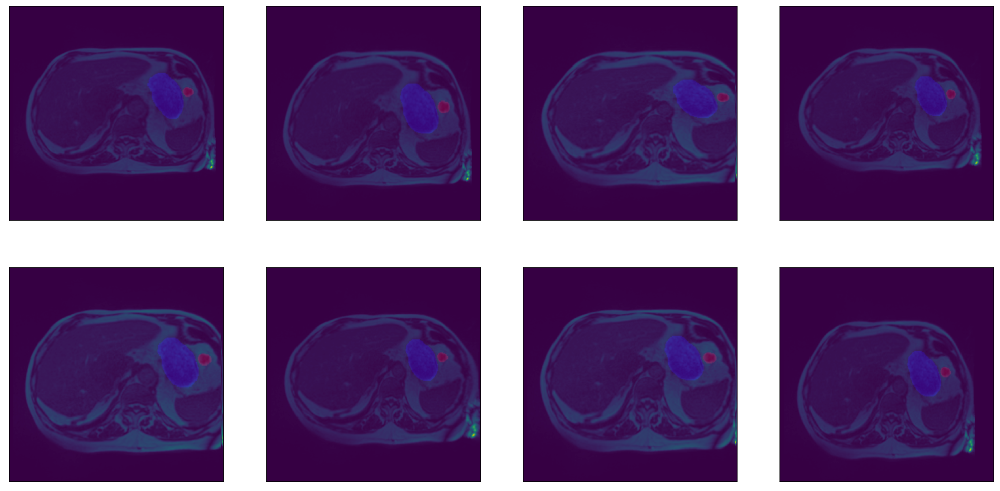

In [9]:
one_transform = albumentations.GridDistortion(
    num_steps=7,
    distort_limit=0.2,
    border_mode=0,
    interpolation=cv2.INTER_LINEAR,
    value=0,
    mask_value=0,
    p=1,
)
plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(image=img, mask=mask)
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## ShiftScaleRotate

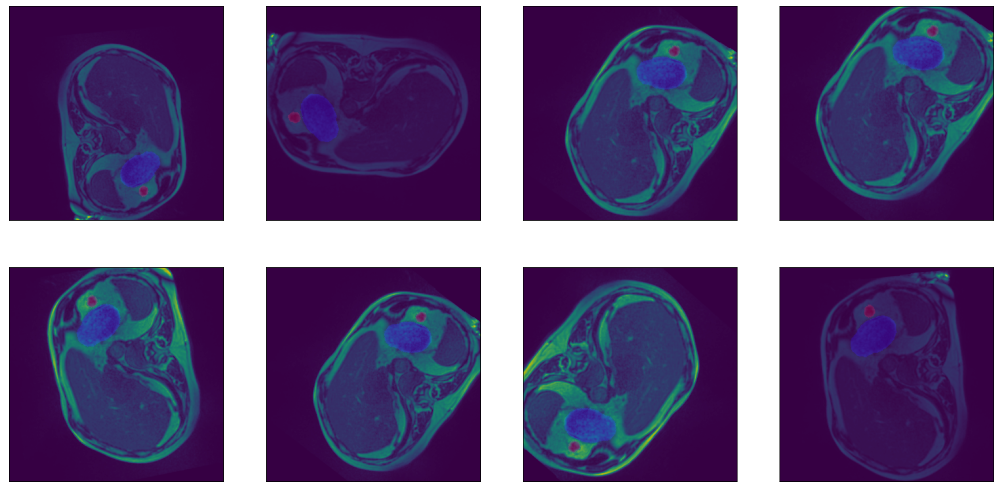

In [10]:
one_transform = albumentations.augmentations.geometric.transforms.ShiftScaleRotate(
    shift_limit=0.0625,
    scale_limit=0.1,
    rotate_limit=180,
    interpolation=cv2.INTER_LINEAR,
    border_mode=0,
    value=0,
    mask_value=0,
    p=1,
)
plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(image=img, mask=mask)
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## RandomBrightnessContrast

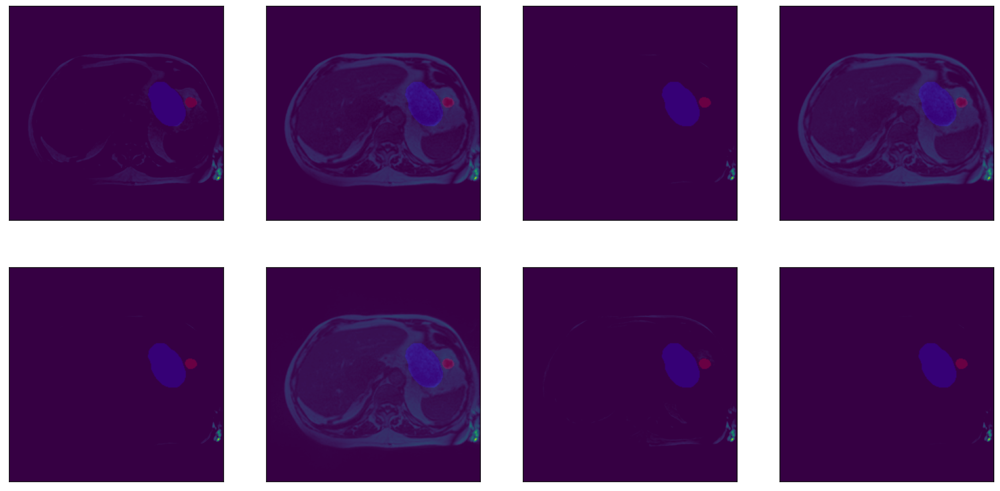

In [11]:
one_transform = albumentations.augmentations.transforms.RandomBrightnessContrast(
    brightness_limit=(-0.2, 0.1),
    contrast_limit=(-0.2, 0.1),
    brightness_by_max=True,
    p=1,
)
plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(
        image=img.astype("float32"), mask=mask.astype("float32")
    )
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## MotionBlur

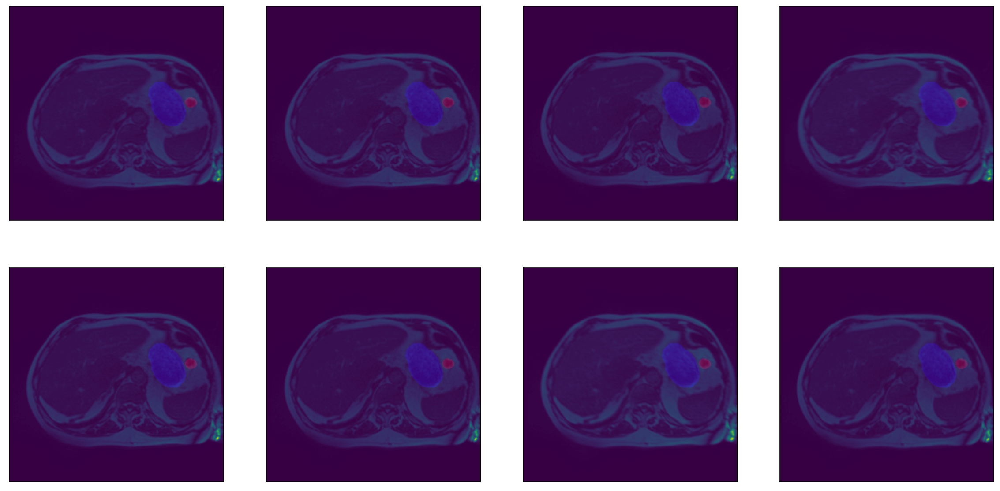

In [12]:
one_transform = albumentations.MotionBlur(p=1.0, blur_limit=(3, 5))


plt.figure(figsize=(20, 10))
for i in range(8):
    transformed = one_transform(
        image=img.astype("float32"), mask=mask.astype("float32")
    )
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(2, 4, i + 1)
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## All transformation

In [13]:
img_size = (384, 384)


def create_transform(img_size):
    transform = albumentations.Compose(
        [
            albumentations.HorizontalFlip(p=0.3),
            albumentations.VerticalFlip(p=0.3),
            albumentations.augmentations.geometric.rotate.RandomRotate90(p=0.3),
            albumentations.Rotate(
                p=0.3,
                limit=(-180, 180),
                interpolation=cv2.INTER_LINEAR,
                border_mode=0,
                value=(0, 0, 0),
                mask_value=None,
            ),
            albumentations.CoarseDropout(
                p=0.05,
                max_holes=8,
                max_height=8,
                max_width=8,
                min_holes=1,
                min_height=1,
                min_width=1,
            ),
            albumentations.OneOf(
                [
                    albumentations.augmentations.geometric.transforms.Perspective(
                        scale=(0.05, 0.05),
                        keep_size=True,
                        pad_mode=0,
                        pad_val=0,
                        mask_pad_val=0,
                        fit_output=False,
                        interpolation=cv2.INTER_LINEAR,
                        p=0.3,
                    ),
                    albumentations.ElasticTransform(
                        alpha=1,
                        sigma=25,
                        alpha_affine=25,
                        border_mode=0,
                        interpolation=cv2.INTER_LINEAR,
                        value=0,
                        mask_value=0,
                        approximate=False,
                        same_dxdy=False,
                        p=0.7,
                    ),
                ],
                p=0.5,
            ),
            albumentations.ShiftScaleRotate(
                shift_limit=0.0625, scale_limit=0.05, rotate_limit=10, p=0.3
            ),
            albumentations.augmentations.crops.transforms.RandomResizedCrop(
                height=img_size[0],
                width=img_size[1],
                scale=(0.8, 1.0),
                ratio=(0.95, 1.05),
                interpolation=cv2.INTER_LINEAR,
                p=0.7,
            ),
            albumentations.OneOf(
                [
                    albumentations.GridDistortion(
                        num_steps=7,
                        distort_limit=0.2,
                        border_mode=0,
                        interpolation=cv2.INTER_LINEAR,
                        value=0,
                        mask_value=0,
                        p=0.5,
                    ),
                    albumentations.augmentations.geometric.transforms.ShiftScaleRotate(
                        shift_limit=0.0625,
                        scale_limit=0.1,
                        rotate_limit=180,
                        interpolation=cv2.INTER_LINEAR,
                        border_mode=0,
                        value=0,
                        mask_value=0,
                        p=0.3,
                    ),
                ],
                p=0.5,
            ),
            albumentations.augmentations.transforms.RandomBrightnessContrast(
                brightness_limit=(-0.2, 0.1),
                contrast_limit=(-0.2, 0.1),
                brightness_by_max=True,
                p=0.2,
            ),
            albumentations.MotionBlur(blur_limit=(3, 5), p=0.1),
        ],
        p=0.8,
    )
    return transform

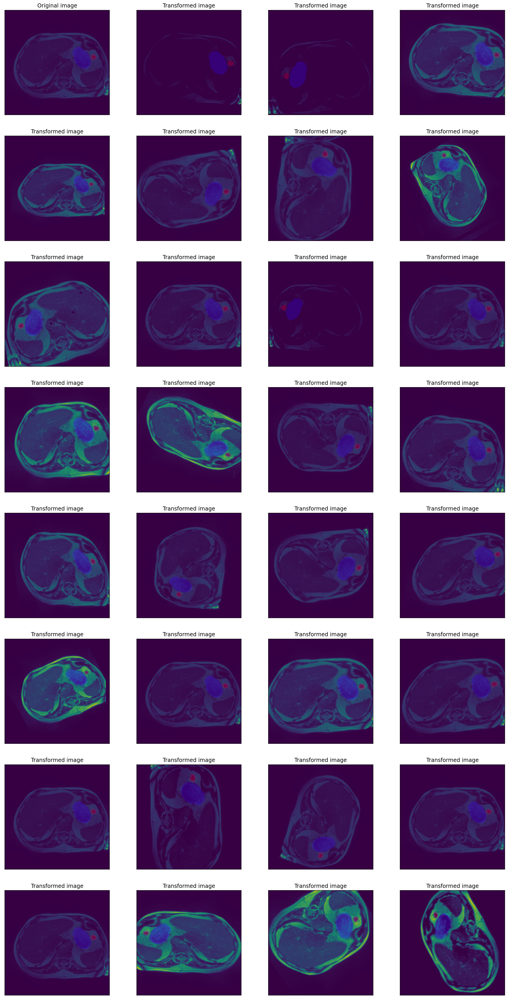

In [14]:
plt.figure(figsize=(20, 40))
transform = create_transform(img_size=img_size)
plt.subplot(8, 4, 1)
plt.title("Original image")
plt.imshow(img)
plt.imshow(mask, alpha=0.2)
plt.xticks([])
plt.yticks([])
for i in range(1, 32):
    transformed = transform(image=img.astype("float32"), mask=mask.astype("float32"))
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(8, 4, i + 1)
    plt.title("Transformed image")
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

## Soft transformation

In [15]:
img_size = (384, 384)


def create_transform(img_size):
    transform = albumentations.Compose(
        [
            albumentations.HorizontalFlip(p=0.3),
            albumentations.VerticalFlip(p=0.3),
            albumentations.augmentations.geometric.rotate.RandomRotate90(p=0.1),
            albumentations.Rotate(
                p=0.2,
                limit=(-10, 10),
                interpolation=cv2.INTER_LINEAR,
                border_mode=0,
                value=(0, 0, 0),
                mask_value=None,
            ),
            albumentations.CoarseDropout(
                p=0.05,
                max_holes=8,
                max_height=8,
                max_width=8,
                min_holes=1,
                min_height=1,
                min_width=1,
            ),
            albumentations.OneOf(
                [
                    albumentations.augmentations.geometric.transforms.Perspective(
                        scale=(0.01, 0.01),
                        keep_size=True,
                        pad_mode=0,
                        pad_val=0,
                        mask_pad_val=0,
                        fit_output=False,
                        interpolation=cv2.INTER_LINEAR,
                        p=0.3,
                    ),
                    albumentations.ElasticTransform(
                        alpha=1,
                        sigma=10,
                        alpha_affine=5,
                        border_mode=0,
                        interpolation=cv2.INTER_LINEAR,
                        value=0,
                        mask_value=0,
                        approximate=False,
                        same_dxdy=False,
                        p=0.7,
                    ),
                ],
                p=0.5,
            ),
            albumentations.augmentations.crops.transforms.RandomResizedCrop(
                height=img_size[0],
                width=img_size[1],
                scale=(0.9, 1.0),
                ratio=(0.95, 1.05),
                interpolation=cv2.INTER_LINEAR,
                p=0.5,
            ),
            albumentations.OneOf(
                [
                    albumentations.GridDistortion(
                        num_steps=7,
                        distort_limit=0.2,
                        border_mode=0,
                        interpolation=cv2.INTER_LINEAR,
                        value=0,
                        mask_value=0,
                        p=0.5,
                    ),
                    albumentations.augmentations.geometric.transforms.ShiftScaleRotate(
                        shift_limit=0.01,
                        scale_limit=0.05,
                        rotate_limit=10,
                        interpolation=cv2.INTER_LINEAR,
                        border_mode=0,
                        value=0,
                        mask_value=0,
                        p=0.3,
                    ),
                ],
                p=0.5,
            ),
            albumentations.augmentations.transforms.RandomBrightnessContrast(
                brightness_limit=(-0.2, 0.1),
                contrast_limit=(-0.2, 0.1),
                brightness_by_max=True,
                p=0.2,
            ),
            albumentations.MotionBlur(blur_limit=(3, 5), p=0.2),
        ],
        p=0.6,
    )
    return transform

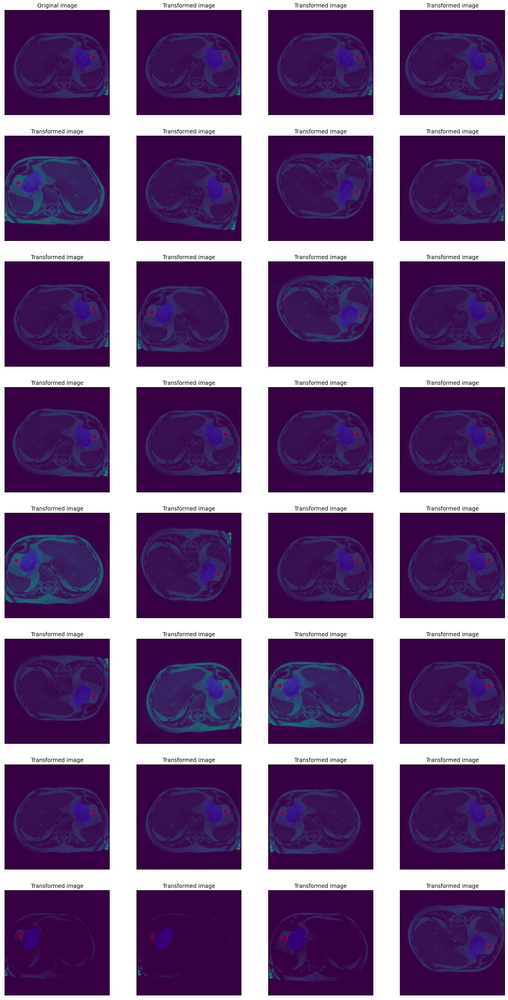

In [16]:
plt.figure(figsize=(20, 40))
transform = create_transform(img_size=img_size)
plt.subplot(8, 4, 1)
plt.title("Original image")
plt.imshow(img)
plt.imshow(mask, alpha=0.2)
plt.xticks([])
plt.yticks([])
for i in range(1, 32):
    transformed = transform(image=img.astype("float32"), mask=mask.astype("float32"))
    tr_img, tr_mask = transformed["image"], transformed["mask"]
    plt.subplot(8, 4, i + 1)
    plt.title("Transformed image")
    plt.imshow(tr_img)
    plt.imshow(tr_mask, alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();